<h1 style="font-size:30px;">Inference with Trained Model</h1>

In this notebook, we shall use the model we trained earlier to perform inference on some sample data.


In TFOD API you can perform inference in two ways.

- Using a CKPT (checkpoint format) model
- Using a Saved_model format.

When you train a model, it get's stored as a `.ckpt` format. Now this format is not ideal for production since it's really big and consists of extra information.

You still can do prediction with this model but it's better if you convert your model to another format called `saved_model` format which is a light weight format mostly used in production.

In this section we will cover and show how to do prediction with both formats.

Finally, we perform a video inference on our **`saved_model`**!

# Table of Contents

* [1 Install the TFOD API](#1-Install-the-TFOD-API)
* [2 Inference With CKPT Model](#2-Inference-With-CKPT-Model)
* [3 Export the CKPT Model into a Saved Model](#3-Export-the-CKPT-Model-into-a-Saved-Model)
* [4 Inference With Saved Model](#4-Inference-With-Saved-Model)

## 1 Install the TFOD API

We start of by installing the **TFOD API**.

In [ ]:
import os
from zipfile import ZipFile
import requests

In [ ]:
# You need to update OpenCV if you are using Colab.
# Uncomment this line if you are using Colab.
!pip install opencv-python --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install pycocotools

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
if not 'models' in os.listdir():
    !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 3425, done.
remote: Counting objects: 100% (3425/3425), done.
remote: Compressing objects: 100% (2860/2860), done.
remote: Total 3425 (delta 895), reused 1394 (delta 508), pack-reused 0
Receiving objects: 100% (3425/3425), 35.12 MiB | 17.73 MiB/s, done.
Resolving deltas: 100% (895/895), done.


In [ ]:
# The `%%bash` magic command inside a notebook lets you run a cell run like a shell interface
# Note: the `bash` command works only on Colab.
%%bash 

# Change the directory to models/research
cd models/research/

# Compile the API's Protobuf files
protoc object_detection/protos/*.proto --python_out=.

# Copy the required Setup file
cp object_detection/packages/tf2/setup.py .

# Install the API using the setup.py file
python -m pip install .

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1694955 sha256=a700f5fcb99659aaba62c09d2d5304b8dfad46b0e459c291cbb3649138ec98f8
  Stored in directory: /tmp/pip-ephem-wheel-cache-28uj1vuq/wheels/fa/a4/d2/e9a5057e414fd46c8e543d2706cd836d64e1fcd9eccceb2329
  Created wheel for py-cpuinfo: filename=py_cpuinfo-8.0.0-py3-none-any.whl size=22257 sha256=f8eb7b07e39ddf5c71539cd704254d28966a2cc5331357f8a21d1619c168796b
  Stored in directory: /root/.cache/pip/wheels/d2/f1/1f/041add21dc9c4220157f1bd2bd6afe1f1a49524c3396b94401
  Created wheel for dill: filename=dill-0.3.1.1-py3-none-any.whl size=78544 sha256=94d3f841208712f8406ad1cd9a1a7bdf85bc51a3570d4ab5ae9529c7ecfb605a
  Stored in directory: /root/.cache/pip/wheels/a4/61/fd/c57e374e580aa78a45ed78d5859b3a44436af17e22ca53284f
  Created wheel for avro-python3: filename=avro_p

  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
multiprocess 0.70.13 requires dill>=0.3.5.1, but you have dill 0.3.1.1 which is incompatible.
gym 0.17.3 requires cloudpickle<1.7.0,>=1.2.0, but you have cloudpickle 2.1.0 which is incompatible.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.28.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,

In [ ]:
!pip install -U tensorflow==2.8.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 668.3 MB 17 kB/s 
     |████████████████████████████████| 462 kB 35.9 MB/s 
     |████████████████████████████████| 5.8 MB 61.0 MB/s 
     |████████████████████████████████| 1.4 MB 61.1 MB/s 
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.9.1
    Uninstalling tensorboard-2.9.1:
      Successfully uninstalled tensorboard-2.9.1
  Attempting uninstall: keras
    Found existing installation: keras 2.9.0
    Uninstalling keras-2.9.0:
      Successfully uninstalled keras-2.9.0
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.9.1
    Uninstalling tensorflow-2.9.1:
      Successfully uninstalled tensorflow-2.9.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-mod

## 2 Inference With CKPT Model

Lets get started by performing Inference using our trained model.

The last training notebook was for FasterRCNN_Resnet101; However, we are also providing three more models that are trained on the same dataset. 

All four models are:

- **`CenterNet HourGlass104 512x512`**, 
- **`EfficientDet D3 896x896`**, 
- **`Faster R-CNN ResNet101 V1 640x640`** and 
- **`SSD ResNet101 V1 FPN 640x640 (RetinaNet101)`**.

All the above models have been trained on images resized to **`(640,640)`**.

We have provided a dictionary that maps the model name to its `ckpt` download link.

In [ ]:
TRAINED_MODELS = {
                    'CenterNet_HourGlass'  : 'https://www.dropbox.com/s/oilbvq2nzkwwgg9/CenterNet_HourGlass.zip?dl=1',
                    'EffDet_D3'            : 'https://www.dropbox.com/s/0ql06hmwnjbryzz/EffDet_D3.zip?dl=1',
                    'FasterRCNN_ResNet101' : 'https://www.dropbox.com/s/nxv1s0geuu5pafx/FasterRCNN_ResNet101.zip?dl=1',
                    'RetinaNet_101'        : 'https://www.dropbox.com/s/4mpu10gjosbsdbc/RetinaNet_101.zip?dl=1',
                 }

You can select your model from the dropdown below.

In [ ]:
#@title Model Selection { display-mode: "form", run: "auto" }
model_display_name = 'FasterRCNN_ResNet101' # @param ['CenterNet_HourGlass', 'EffDet_D3', 'FasterRCNN_ResNet101', 'RetinaNet_101']
model_handle = TRAINED_MODELS[model_display_name]

print('Selected model:'+ model_display_name)

Selected model:FasterRCNN_ResNet101


### 1.1 Utility Functions for Downloading and Extracting zip Files

In [ ]:
def download_file(url, save_name):
    url = url
    file = requests.get(url)

    open(save_name, 'wb').write(file.content)

In [ ]:
def unzip(zip_file=None):
    try:
        with ZipFile(zip_file) as z:
            z.extractall("./")
            print("Extracted all")
    except:
        print("Invalid file")

**Let us download and unzip the selected model.**

In [ ]:
if not os.path.exists(model_display_name):
    download_file(
                  model_handle, 
                  f'{model_display_name}.zip'
                 )
    unzip(zip_file=f'{model_display_name}.zip')

Extracted all


**Let us do the required imports.**

In [ ]:
# Importing required libraries and files
import time

import numpy as np
import tensorflow as tf

from PIL import Image
import cv2

from object_detection.utils import (
                                    dataset_util,
                                    label_map_util,
                                    config_util
                                   )

from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder
from object_detection.utils import ops as utils_ops

%matplotlib inline

**Let us download and unzip required test images.**

In [ ]:
if not os.path.exists('val'):
    download_file(
                  'https://www.dropbox.com/s/gzb7a83ov5u1rf5/val.zip?dl=1', 
                  'val.zip'
                 )
    unzip(zip_file='val.zip')

Extracted all


**Get all image paths from the `val` directory.**


In [ ]:
# Get Paths of our test images.
TEST_IMAGE_PATHS = ['val/' + f for f in  os.listdir('val') if f.endswith('.jpg')]

**Let us write a function that takes a `ckpt` model and return a callable function for inference.**

In [ ]:
# This Fucntion will return a model object that can be directly 
# used to run a forward pass on new images.
def get_model_detection_function(model):
    """Get a tf.function for detection."""

    @tf.function(experimental_relax_shapes=True)
    def detect_fn(image):
        """
        Returns detections and predections on an image passed to the model
        """

        # Automatically preproccess according to the trained model configuration.
        image, shapes = model.preprocess(image)

        # Perform the prediciton.
        prediction_dict = model.predict(image, shapes)

        # Postprocess the predictions so they can be visualized.
        detection_dict = model.postprocess(prediction_dict, shapes)

        return detection_dict

    return detect_fn


**The configuration filename and checkpoint directory name are `pipeline.config` and `training_of_model`, respectively. And this is the same for all models.**

In [ ]:
pipeline_config_filename = 'pipeline.config'
ckpt_dirname = 'training_of_model'

**Let's get the checkpoints and pipeline configuration paths for the selected model.**


In [ ]:
model_ckpt_path = os.path.join(model_display_name, ckpt_dirname)
pipeline_config_path = os.path.join(model_display_name, pipeline_config_filename)

The below code cell do the following:

- Load the model configuration,
- Build the model using the configuration,
- Load the checkpoint weights to the model and
- Use the model to get the inference function for the model.

In [ ]:
# initialize the configuration file (pipeline.config) and load the model configuration.
configs = config_util.get_configs_from_pipeline_file(pipeline_config_path)
model_config = configs['model']

# Build the detection model from the models configuration.
detection_model = model_builder.build(model_config=model_config, is_training=False)

# Restore the checkpoint model.
ckpt = tf.train.Checkpoint(model=detection_model)
ckpt.restore(tf.train.latest_checkpoint(model_ckpt_path)).expect_partial()

# Call the method to create the model object.
ckpt_inference_fn = get_model_detection_function(detection_model)

Now we will use the label map from our models configuration and to create a category index which is a label integer mapping.

You can try printing the **`cateogory_index`**.

In [ ]:
# Restore the labelmap.
label_map_path = os.path.join(model_display_name, configs['eval_input_config'].label_map_path)
label_map = label_map_util.load_labelmap(label_map_path)

# Create an index of the categories so our predictions can be labelled accordingly.
category_index = label_map_util.create_category_index_from_labelmap(label_map_path, use_display_name=True)


After loading the `ckpt model` / `saved model`, we use the function below to run the inference.

This function takes the following arguments:

- image/frame, 
- the model inference function,
- the category index,
- a boolean flag for whether to use the saved model or the ckpt model

The function makes the inference and also plots prediction to visualize it. It usages the `viz_utils` from TFOD API for plotting. 


In [ ]:
def get_visualizations_and_inf_time(image, model_det_fn, category_index, use_saved_model=True):

    # Convert image into a tensor.
    if use_saved_model:
        input_tensor = tf.convert_to_tensor(image)
        label_id_offset = 0 
    else:
        input_tensor = tf.convert_to_tensor(image, dtype = tf.float32)
        # Set a label id offset because the model will start predicitions from 0 but
        # 0  is the background index for ckpt model format.
        label_id_offset = 1

    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis,...]
    
    start = time.time()
    # Predict on the tensor image.
    output_dict = model_det_fn(input_tensor)
    end = time.time()

    # Get total no. of detections in the image.
    num_detections = int(output_dict.pop('num_detections'))

    # Convert our output tensor to a numpy array.
    output_dict = {key:value[0, :num_detections].numpy() for key,value in output_dict.items()}
    output_dict['num_detections'] = num_detections

    # Use the TensorFlow visualization_utils.py to draw the bounding boxes along with the class labels and the confidences.
    viz_utils.visualize_boxes_and_labels_on_image_array(

      # Image to draw boxes on.
      image,
      # Array of Detection Boxes.
      output_dict['detection_boxes'],
      # Array of classes
      (output_dict['detection_classes'] + label_id_offset).astype(int),
      # Array of prediction scores of each detection.
      output_dict['detection_scores'],
      # Category index from label map.
      category_index,
      # Normalize the coodindates.
      use_normalized_coordinates=True,
      # Max boxes to draw on the image.
      max_boxes_to_draw=30,
      # Minimum level of confidence for each detection to be considered valid.
      min_score_thresh=.50,
      # Show classes with scores. 
      agnostic_mode=False)
    
    return image, end-start



Now we'll give our model some test images for predicitons and visualize the results using the `get_visualizations_and_inf_time` function.

INFO:tensorflow:depth of additional conv before box predictor: 0
Instructions for updating:
Use ref() instead.


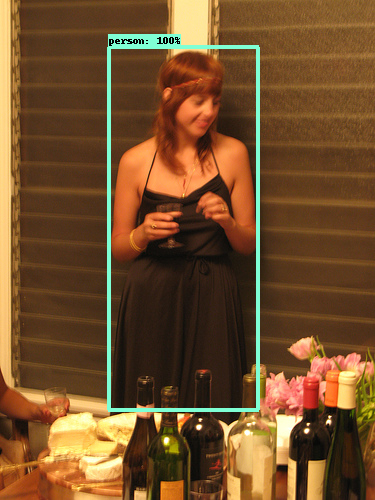

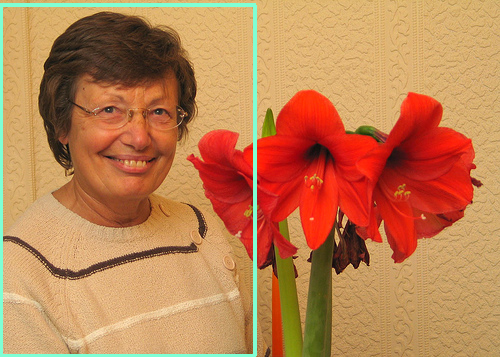

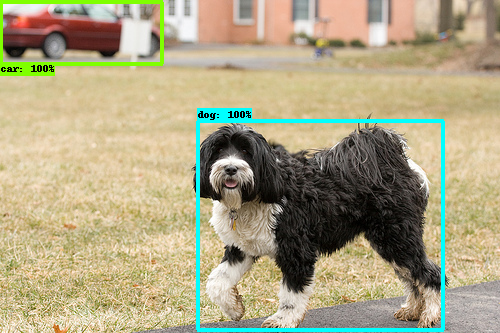

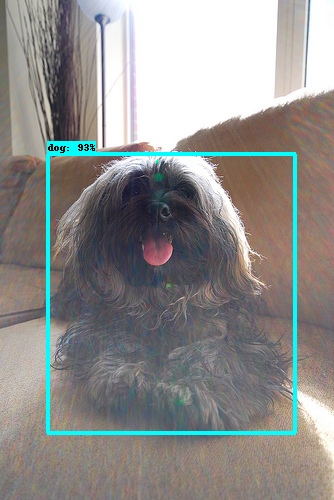

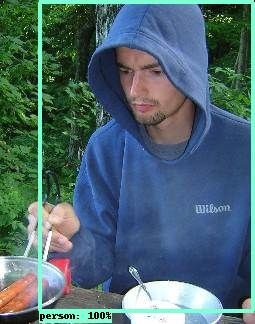

...

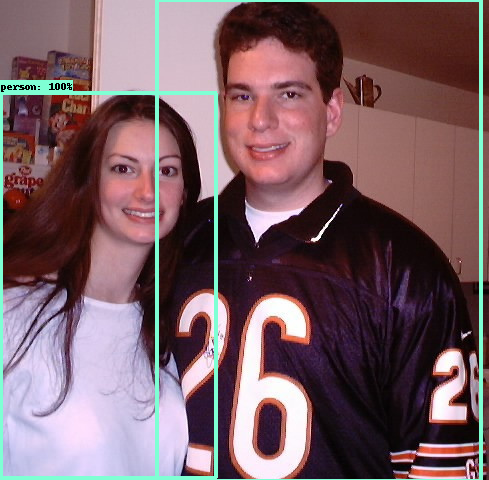

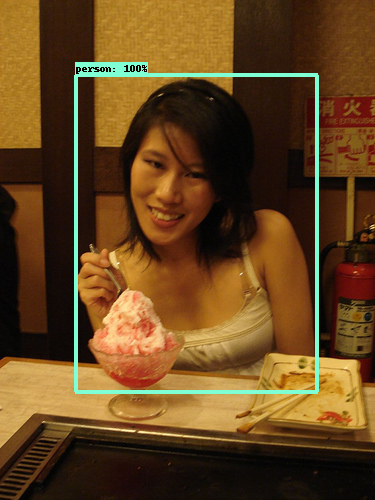

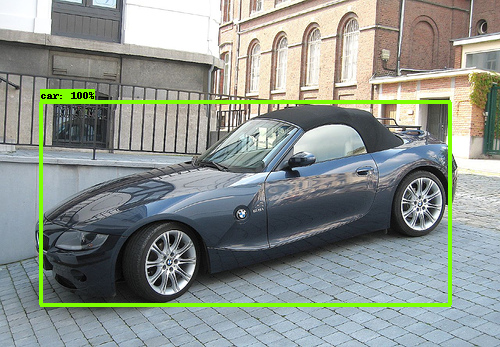

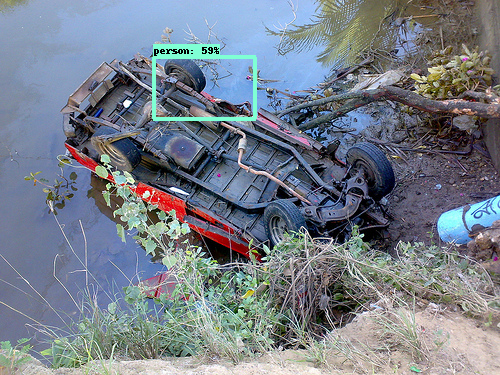

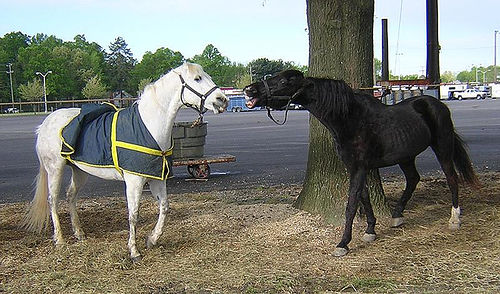

In [ ]:
for i, image_path in enumerate(TEST_IMAGE_PATHS):

    # Read the image as a numpy array.
    image = np.array(Image.open(image_path))

    image_pred, _ = get_visualizations_and_inf_time(image, ckpt_inference_fn, category_index, use_saved_model=False)

    # Displaying the image along with bounding box predictions.
    display(Image.fromarray(image_pred))

    if i>10:
        break

## 3 Export the CKPT Model into a Saved Model

Saved Model Format is the default go-to model format in TensorFlow because it is very lightweight so it can easily be deployed into real-world applications. When we use the API the model first saves its weights in a CKPT format but we can use the  `exporter_main_v2.py` script that comes with TFOD API to export our model into a saved model. Some of the advantages of the Saved Model are: 

* It's Lightweight
* Portability: Easily loaded in other languages like Java and JavaScript
* Easily deployed in GCP (Google Cloud Platform)

In [ ]:
# Directory of your Trained model
output_directory = 'saved_model'

In [ ]:
# Run the script to export the model into saved_model format
# You will need to pass, your trained model ckpt directory, pipeline path, output dir.
!python ./models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {model_ckpt_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_config_path}


2022-07-29 08:22:26.259310: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W0729 08:22:26.387708 139698049263488 deprecation.py:615] From /usr/local/lib/python3.7/dist-packages/tensorflow/python/autograph/impl/api.py:458: calling map_fn_v2 (from tensorflow.python.ops.map_fn) with back_prop=False is deprecated and will be removed in a future version.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
2022-07-29 08:22:31.695574: W ten

## 4 Inference With Saved Model

Now that we have exported the model into Saved Model format, we can do inference using that as well. This function `load_saved_model()` will load our model.

In [ ]:
# Method to load model from the Saved Model
def load_saved_model(trained_model_path):
    '''
    Args:
    trained_model_path: Directory where saved_model is saved.
    '''
    
    # Load model from the training directory
    model_dir = os.path.join(trained_model_path, "saved_model")
    model = tf.saved_model.load(model_dir)
    model = model.signatures['serving_default']
    return model  


In [ ]:
# Call the load model method to load the trained model
saved_model_inference_fn = load_saved_model(output_directory)

**Run the inference with `saved_model` on test images**

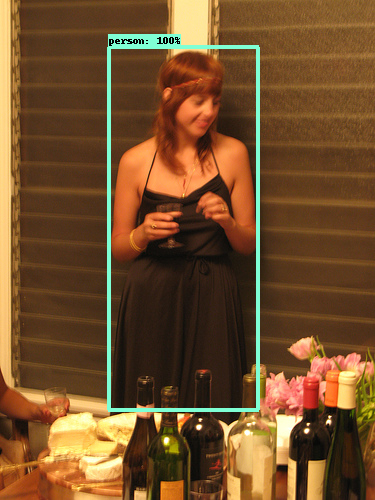

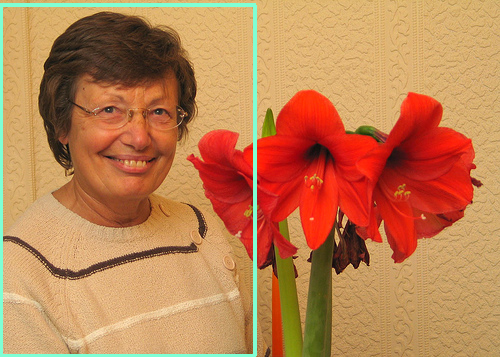

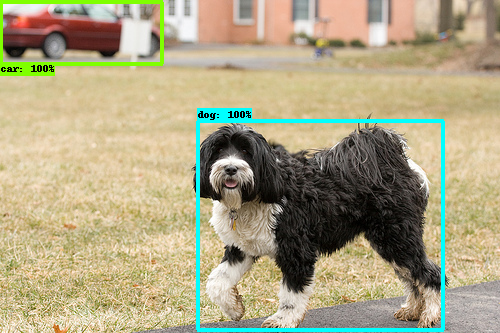

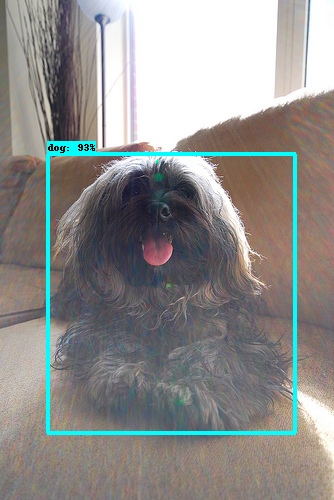

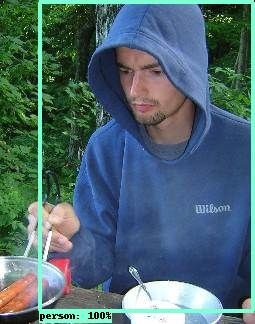

...

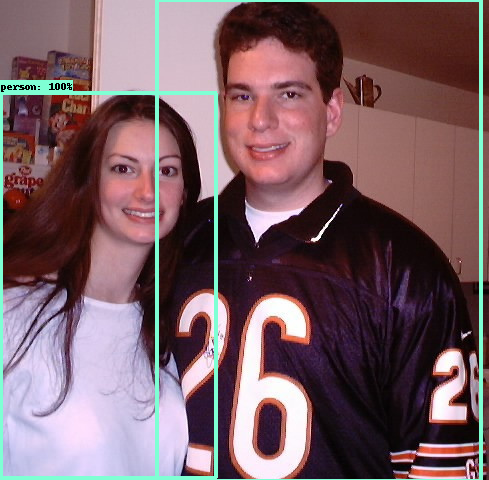

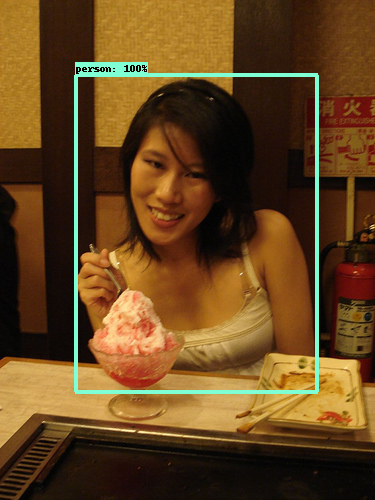

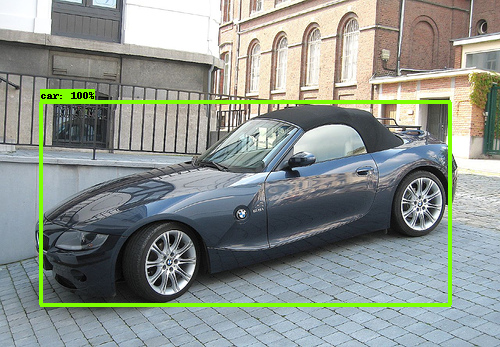

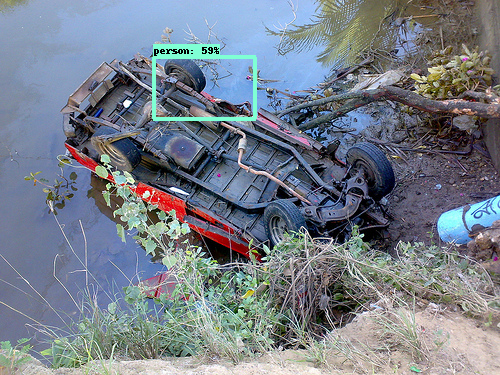

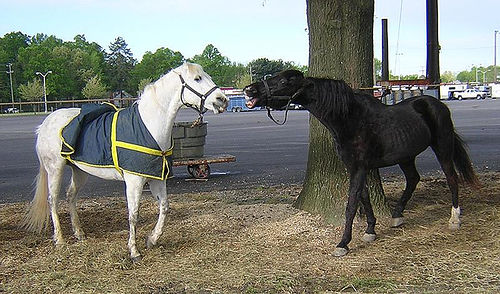

In [ ]:
# Loop over all test images and predict.
for i, image_path in enumerate(TEST_IMAGE_PATHS):

    # Read the image as a numpy array.
    image = np.array(Image.open(image_path))

    image_pred, _ = get_visualizations_and_inf_time(image, saved_model_inference_fn, category_index, use_saved_model=True)

    # Displaying the image along with bounding box predictions.
    display(Image.fromarray(image_pred))

    if i>10:
        break

### 4.1 Inference on a Sample Video


**Let us run the inference on a sample video.**

First, download the video.

In [ ]:
download_file(
                  'https://www.dropbox.com/s/w5b67ajb5ec4b25/video_sample.mp4?dl=1', 
                  'video_sample.mp4'
             )

Let us write a function for video inference. 

The function takes the following argument:
- the video path,
- the model inference function,
- model name (string), e.g. RetinaNet, FasterRCNN, etc.
- the category index.

It loads the video and makes inference on each frame of the video. It usages get_visualizations_and_inf_time for inference and prediction visualization. It also usages `cv2.VideoWriter` to write predicted frames. 


In [ ]:
def inference_on_video(video_path, model_det_fn, model_name, category_index):
    """
    Read video frames one-by-one, flip it, and write in the other video.
    """

    video = cv2.VideoCapture(video_path)
    
    # Check if camera opened successfully
    if not video.isOpened(): 
        print("Error opening video file")
        return
    
    # create video writer
    width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
    frames_per_second = video.get(cv2.CAP_PROP_FPS)
    num_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
    
    output_fname = '{}_{}_out.mp4'.format(os.path.splitext(video_path)[0], model_name)
    
    output_file = cv2.VideoWriter(
        filename=output_fname,
        fourcc=cv2.VideoWriter_fourcc(*'mp4v'),
        fps=float(frames_per_second),
        frameSize=(width, height),
        isColor=True,
    )
    
    
    i = 0
    while video.isOpened():
        ret, frame = video.read()
        if ret:
            output_frame, inf_time = get_visualizations_and_inf_time(frame[...,::-1], model_det_fn, category_index, use_saved_model=True)
            fps = 1./ inf_time
            disp_fps = "FPS: "+ str(round(fps,2))
            output_frame = np.ascontiguousarray(output_frame)
            output_frame = cv2.putText(output_frame, disp_fps, (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (100, 255, 255), 3)
            output_frame = cv2.putText(output_frame, f'Model: {model_name}', (10, 100), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (100, 255, 255), 3)
            
            output_file.write(output_frame[...,::-1])        

            i += 1
        else:
            break
        
    video.release()
    output_file.release()
    
    return

In [ ]:
video_file = "video_sample.mp4"
inference_on_video(video_file, saved_model_inference_fn, model_display_name, category_index)

**Take a look at the sample inference video!**

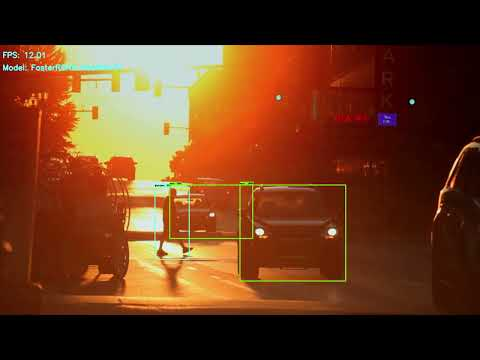

In [ ]:
from IPython.display import YouTubeVideo, display
video = YouTubeVideo("X2wnWkT5XsE", width=800, height=450)
display(video)